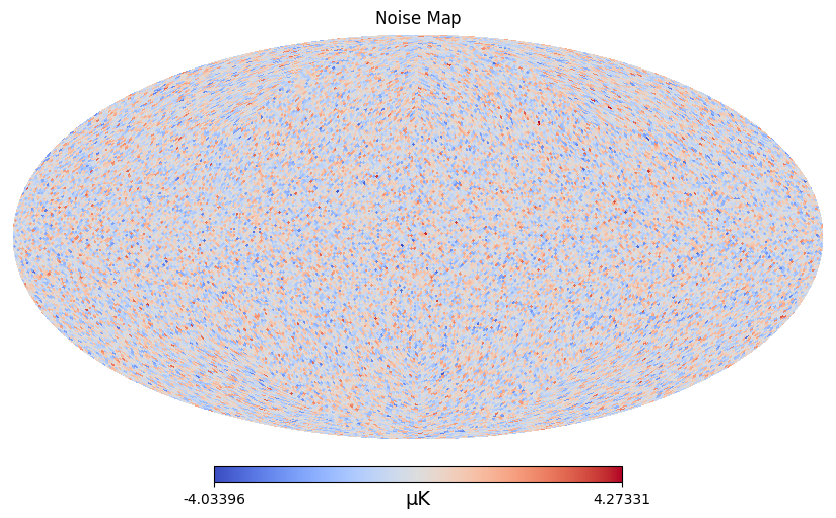

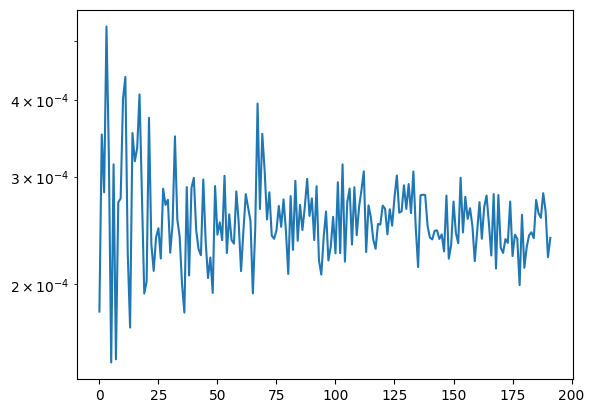

In [3]:
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt

nside = 64
npix = hp.nside2npix(nside)
#plotting a basic noise maps and its power spectrum
mean = 0 
std_deviation1 = 1.0 

random_map1 = np.random.normal(loc=mean, scale=std_deviation1, size=npix)
hp.mollview(random_map1, title="Noise Map", unit="µK", cmap="coolwarm")
plt.show()

ps1 = hp.sphtfunc.anafast(random_map1, map2=None, nspec=None, lmax=None, mmax=None, iter=3, alm=False, pol=True, use_weights=False, datapath=None, gal_cut=0, use_pixel_weights=False)
plt.semilogy(ps1)
plt.show()

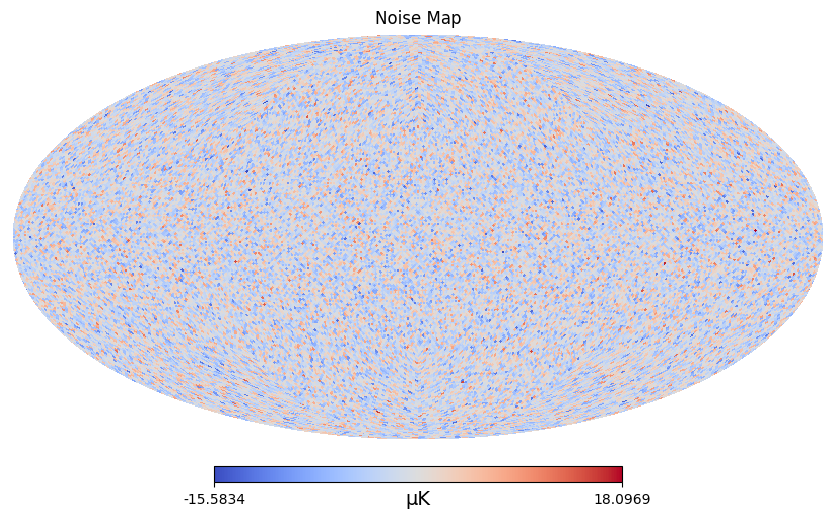

In [16]:
mean = 0 

std_deviation2 = 4.0 

random_map2 = np.random.normal(loc=mean, scale=std_deviation2, size=npix)
hp.mollview(random_map2, title="Noise Map", unit="µK", cmap="coolwarm")
plt.show()

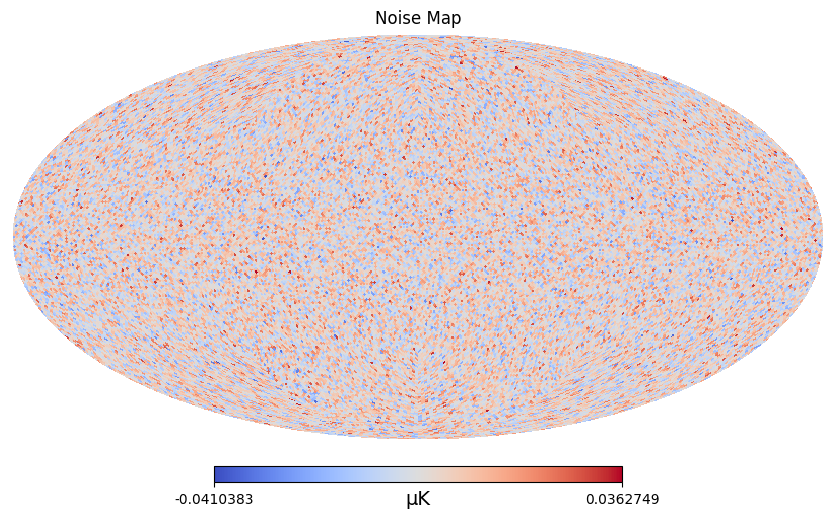

In [17]:
mean = 0 
std_deviation3 = 0.01

random_map3 = np.random.normal(loc=mean, scale=std_deviation3, size=npix)
hp.mollview(random_map3, title="Noise Map", unit="µK", cmap="coolwarm")
plt.show()

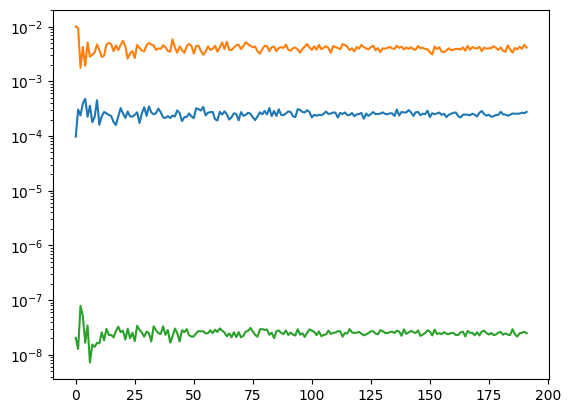

In [32]:
ps1 = hp.sphtfunc.anafast(random_map1, map2=None, nspec=None, lmax=None, mmax=None, iter=3, alm=False, pol=True, use_weights=False, datapath=None, gal_cut=0, use_pixel_weights=False)
ps2 = hp.sphtfunc.anafast(random_map2, map2=None, nspec=None, lmax=None, mmax=None, iter=3, alm=False, pol=True, use_weights=False, datapath=None, gal_cut=0, use_pixel_weights=False)
ps3 = hp.sphtfunc.anafast(random_map3, map2=None, nspec=None, lmax=None, mmax=None, iter=3, alm=False, pol=True, use_weights=False, datapath=None, gal_cut=0, use_pixel_weights=False)
plt.semilogy(ps1)
plt.semilogy(ps2)
plt.semilogy(ps3)
plt.show()

cosmic variance
guasian noise with throughtout same variance is white nosie , then the Nl / Cl is constant
\

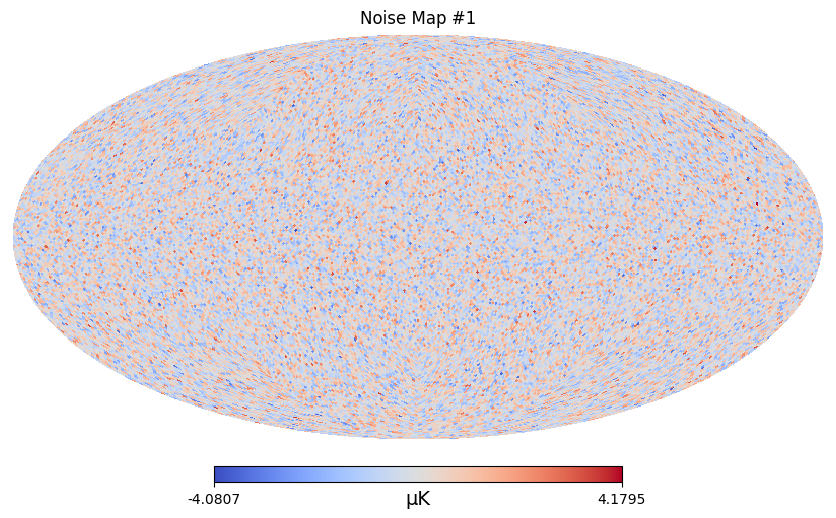

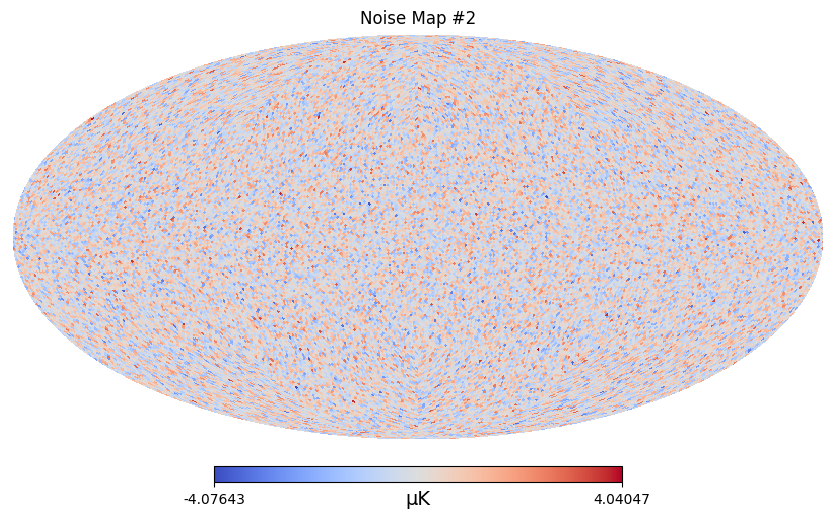

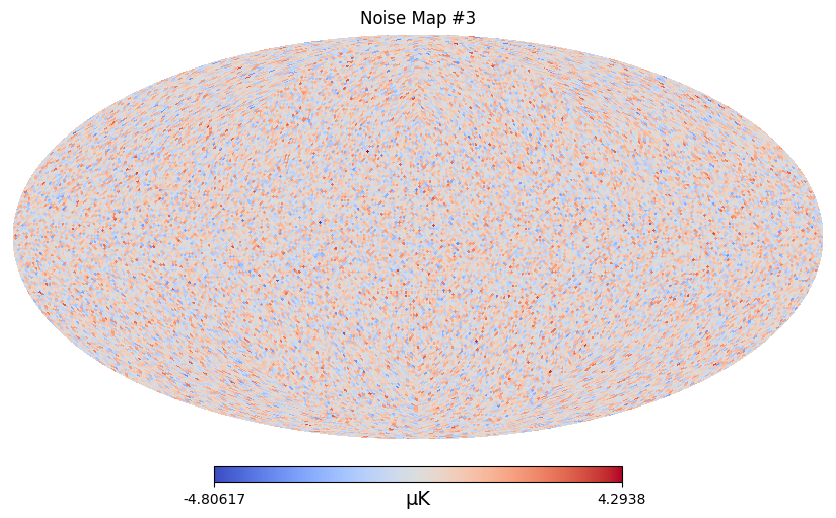

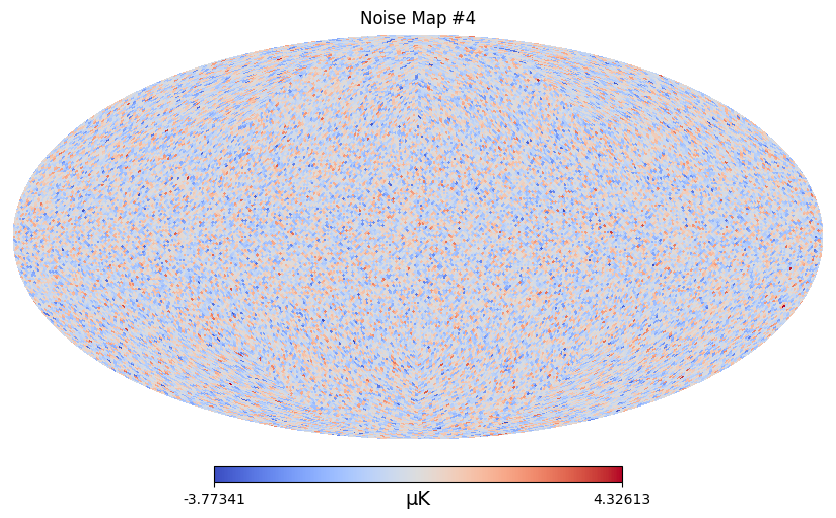

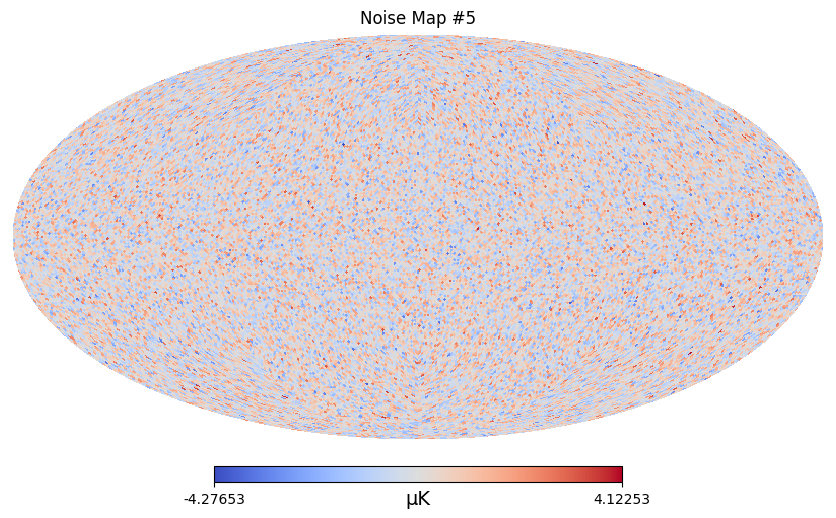

...

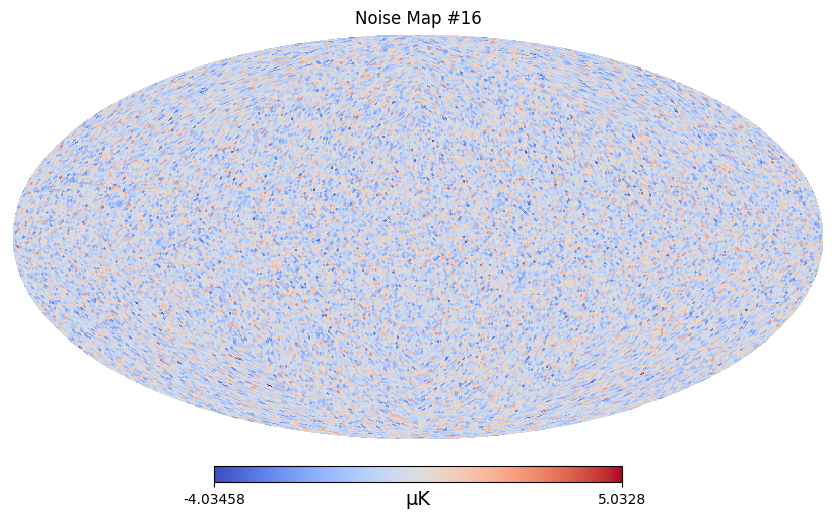

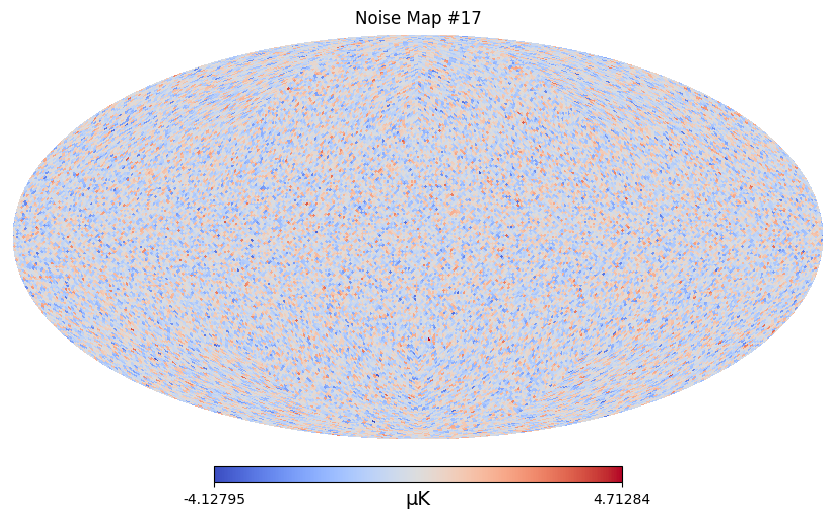

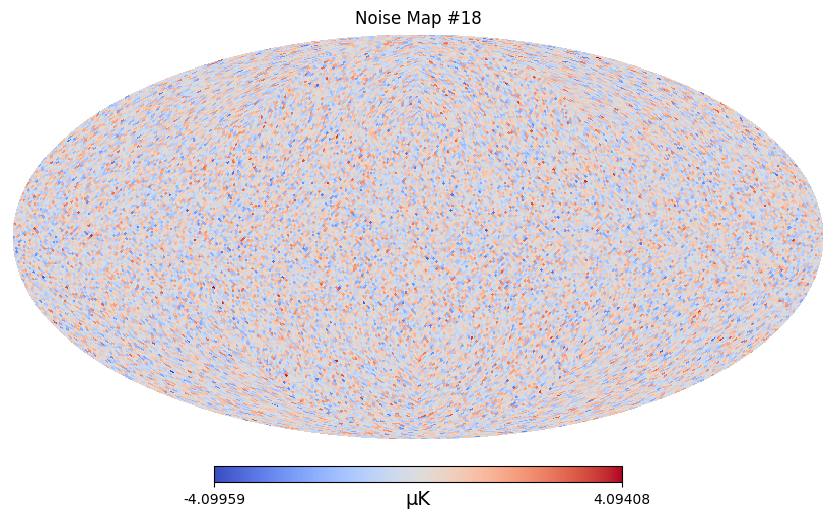

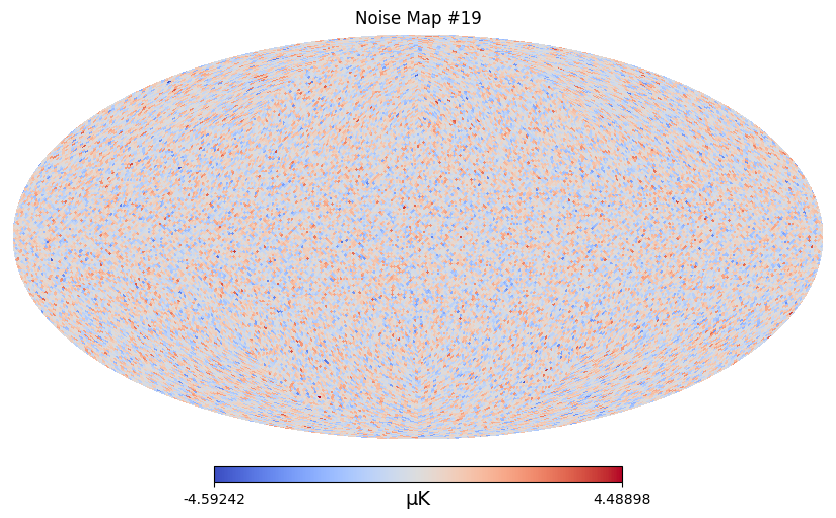

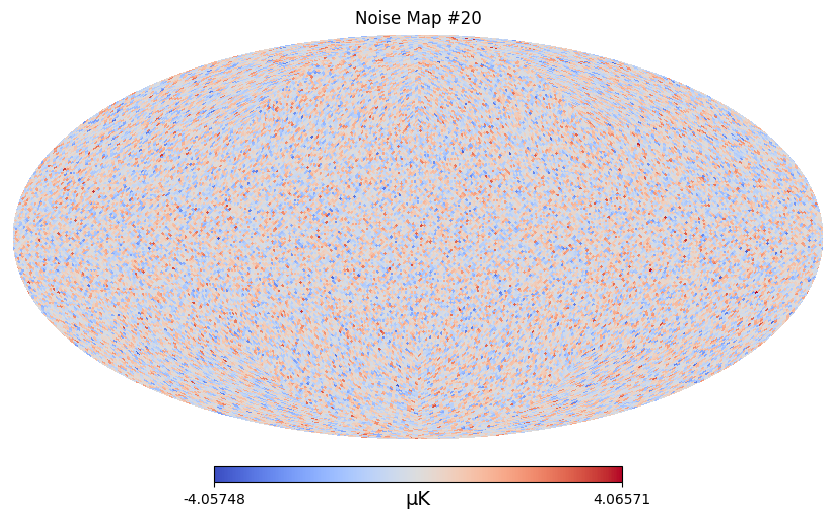

[[1.83136947e-04 3.27164448e-04 2.32188631e-04 ... 2.45961952e-04
  2.63518531e-04 2.20901882e-04]
 [4.24984358e-05 2.79653659e-04 1.76977136e-04 ... 2.49877986e-04
  2.52867770e-04 2.67111883e-04]
 [2.27994037e-05 2.54263039e-04 2.67393935e-04 ... 2.44651811e-04
  2.46608803e-04 2.49101393e-04]
 ...
 [5.79256975e-05 2.23581984e-04 3.01077522e-04 ... 2.45500974e-04
  2.97968828e-04 2.41120235e-04]
 [8.36198732e-06 7.23864215e-04 1.05637515e-04 ... 2.61821497e-04
  2.62459898e-04 2.81923280e-04]
 [3.98086459e-04 4.79185463e-04 3.19013097e-04 ... 2.77618545e-04
  2.28890975e-04 2.66831626e-04]]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  9

In [55]:
spectra_list = []
for i in range(20):
    random_map = np.random.normal(loc=0, scale= 1, size=npix )
    cl = hp.anafast(random_map)  # Auto-spectrum
    spectra_list.append(cl)
    l = np.arange(len(cl))  # Gives [0, 1, 2, ..., ℓ_max]

    
    hp.mollview(
        random_map, 
        title=f"Noise Map #{i+1}", 
        unit="µK", 
        cmap="coolwarm", 
    )

    plt.show()
spectra_array = np.array(spectra_list)
print (spectra_array)
print (l)


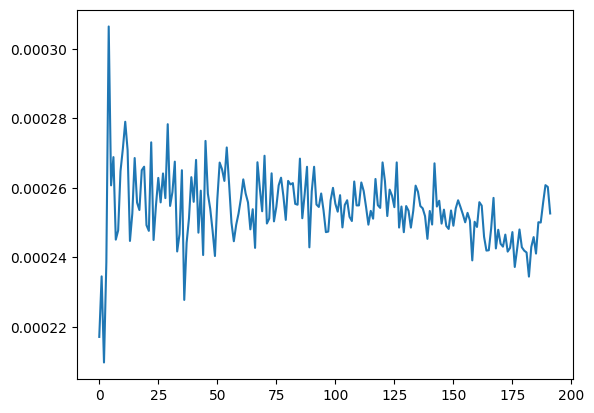

In [54]:
column_variances = np.var(spectra_array, axis=0)
    print(column_variances)column_means = np.mean(spectra_array, axis=0)
plt.plot(column_variances)

plt.plot(column_means)

Value = 2 *column_means*column_means / ( (2*l) +1) #Value = cosmic variance 
plt.semilogy(Value)
plt.semilogy(column_variances)
plt.show()

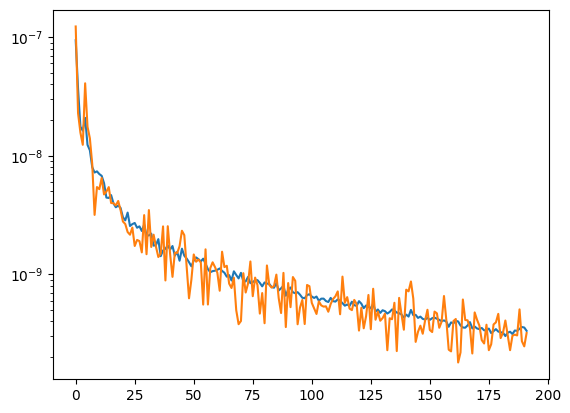

In [57]:
Value = 2 *column_means*column_means / ( (2*l) +1)
plt.semilogy(Value)
plt.semilogy(column_variances)
plt.show()

Cosmic variance = value 